# Generación de estado aleatorio
En el siguiente notebook se presenta como generar un estado aleatorio perteneciente a un qubit de 3 distintas maneras. Una de ellas otorgada dentro de la librería de qiskit.quantum_info llamada random_statevector; la segunda de mi autoría generando los coeficientes en base a los ángulos $\theta$ y $\phi$ coorespondientes a la esfera de Bloch; la tercera también de mi autoría coorespondientes a los coeficientes $a$ y $b$ de una función que describe a un qubit utilizando una distribución Gaussiana. 

In [1]:
#Importación de librerías

#!pip install qiskit ipywidgets    correr esta línea de primero si se trabaja en google collab
#Importación de qiskit
from qiskit import *

%matplotlib inline
from matplotlib import *

# Librerías estandar de qiskit
from qiskit.quantum_info import random_statevector, Statevector,random_density_matrix

#Se importa kaleidoscope para poder plotear varios vectores en una misma esfera de bloch
#(esto es para ver si rellena uniformemente la esfera el estado aleatorio)
from kaleidoscope import bloch_sphere
#Se importa la función para generar vectores aleatorios proporcionado por IBM
from qiskit.quantum_info import random_statevector, Statevector
import qiskit.quantum_info as qi
#Al plotear usando kaleidoscope da algunos warnings molestos
#Esto es simplemente para que no aparezcan
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import numpy as np
import matplotlib.pyplot as plt

## Representación de Qubits
El estado perteneciente un qubit puede ser escrito de la forma $$ |\psi>= a |0> + b |1> $$
En donde $0 \leq \theta \leq \pi$ ; $0 \leq \phi \leq2\pi$; $ a= cos(\frac{\theta}{2}) $ ; $b= e^{i\phi}sin(\frac{\theta}{2})  $
Además se debe cumplir con que $|a|^2 + |b|^2=1$


### Función para proyectar la matríz de densidad a coordenadas rectangulares sobre la esfera de Bloch:
Se creó una función para qubits en 2 dimensiones , para poder graficar la matríz de densidad respectiva a un estado sobre la esfera de Bloch.
Esto se puede realizar utilizando la ecuación (7.168) de Nielsen y Chueng : 
$$ r_k =   <\sigma_k> = tr(\rho \sigma_k)$$

In [3]:
"""Función para transformar matríz de densidad hacia coordenadas cartesianas sobre la esfera de bloch"""
def rho_to_cartesian(rho):                            
    """
    Argumento(s): 
    rho: matríz de densidad respectiva a un qubit de 2 dimensiones
    Salida: representación del estado en coordenadas cartesianas sobre la Esfera de Bloch
    """
    #Matrices de Pauli (2 dimensiones)
    S_x=np.array([[0,1],[1,0]])
    S_y=np.array([[0,-1.j],[1.j,0]])
    S_z=np.array([[1,0],[0,-1]])
    
    #Transformación de la matríz de densidad hacia las coordenadas 
    #Sabiendo que que rho= (I + r*sigma)/2
    rx= np.trace(np.matmul(rho,S_x))
    ry= np.trace(np.matmul(rho,S_y))
    rz= np.trace(np.matmul(rho,S_z))
    #Se guardan las posiciones en un vector de numpy
    posicion=np.array([np.real(rx),np.real(ry),np.real(rz)])
    return posicion


In [5]:
#Función para generar un estado aleatorio: mi acercamiento
def aleatorio_erroneo_polos(seed=None):
    """" Argumento(s): 
    seed:  Entero para generar una semilla por si se desean replicar resultados
    (dejarlo vacío si este no es el caso)
    Salida: Estado inicial (statevector), Estado inicial en coordenadas trigonométricas"""
    
    #Variables para theta y phi
    theta=0
    phi=0
    
    #Verificación para generar una semilla aleatoria
    if seed is None:
        np.random.seed()
    else:
        np.random.seed(seed)
    
    #Se genera phi como theta de manera uniforme, para evitar
    #que se generen puntos aleatorios por los polos es necesario entonces
    #expresar a theta como el arc coseno de (2pin-1) donde n es un número aleatorio
    #en el intervalo [1,0)
    phi = 2 * np.pi * np.random.uniform()
    theta=np.pi*np.random.uniform()
#     theta = np.arccos(2*np.random.uniform()-1)

    #Se establecen las componentes del qubit con los datos aleatorios obtenidos
    a=np.cos(theta/2)
    b=np.exp(phi*1.j)*np.sin(theta/2)

    #Se guardan en un vector
    vector = [a,b]
    #Se normaliza el vector, dando como resultado el estado inicial 
    estado_inicial = np.array(vector/np.linalg.norm(vector))
 
    #Aquí se retorna el vector hacia coordenadas cartesianas
    cartesiano=rho_to_cartesian(qi.DensityMatrix(estado_inicial))
    
    return estado_inicial,cartesiano

a,b=aleatorio_erroneo_polos()

print("Estado inicial |psi>= ", a)

Estado inicial |psi>=  [0.99082692+0.j         0.01119316-0.13467269j]


## Función de estado aleatorio: Mi acercamiento

Para este acercamiento se hace el uso de np.random() perteneciente a Numpy. Con ella se pretende generar 2 números con distribución uniforme para generar los ángulos $\theta$ como $\phi$. Luego se verifica si esta se distribuye uniformemente en la esfera de Bloch.

### 1) Función estado_aleatorio()

In [7]:
#Función para generar un estado aleatorio: mi acercamiento
def estado_aleatorio(seed=None):
    """" Argumento(s): 
    seed:  Entero para generar una semilla por si se desean replicar resultados
    (dejarlo vacío si este no es el caso)
    Salida: Estado inicial (statevector), Estado inicial en coordenadas trigonométricas"""
    
    #Variables para theta y phi
    theta=0
    phi=0
    
    #Verificación para generar una semilla aleatoria
    if seed is None:
        np.random.seed()
    else:
        np.random.seed(seed)
    
    #Se genera phi como theta de manera uniforme, para evitar
    #que se generen puntos aleatorios por los polos es necesario entonces
    #expresar a theta como el arc coseno de (2pin-1) donde n es un número aleatorio
    #en el intervalo [1,0)
    phi = 2 * np.pi * np.random.uniform()
#     theta=np.pi*np.random.uniform()
    theta = np.arccos(2*np.random.uniform()-1)

    #Se establecen las componentes del qubit con los datos aleatorios obtenidos
    a=np.cos(theta/2)
    b=np.exp(phi*1.j)*np.sin(theta/2)

    #Se guardan en un vector
    vector = [a,b]
    #Se normaliza el vector, dando como resultado el estado inicial 
    estado_inicial = np.array(vector/np.linalg.norm(vector))
 
    #Aquí se retorna el vector hacia coordenadas cartesianas
    cartesiano=rho_to_cartesian(qi.DensityMatrix(estado_inicial))
    
    return estado_inicial,cartesiano

a,b=estado_aleatorio()
print("Estado inicial |psi>= ", a)
bloch_sphere(b)
estado_aleatorio()

Estado inicial |psi>=  [0.73393385+0.j        0.06857575+0.6757503j]


(array([0.97783559+0.j        , 0.10541766-0.18089963j]),
 array([ 0.20616227, -0.3537802 ,  0.91232488]))

Que también se puede representar como un punto sobre la esfera 

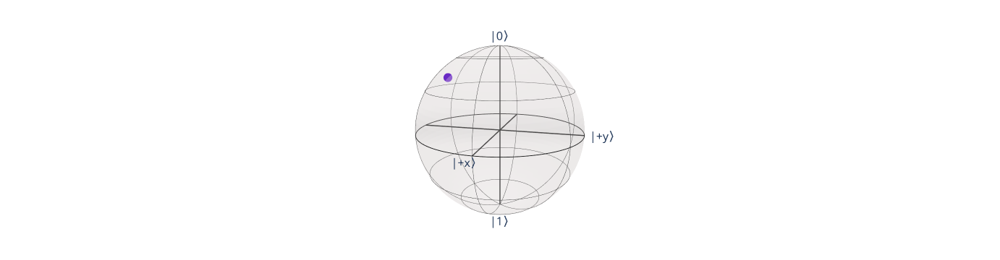

In [67]:
bloch_sphere(points=b)

### 2) Función estado_aleatorio_normal(): 


In [8]:
#Función para generar un estado aleatorio usando una distribución Normal 
def estado_aleatorio_normal(seed=None):
    """" Argumento(s): 
    seed:  Entero para generar una semilla por si se desean replicar resultados
    (dejarlo vacío si este no es el caso)
    Salida: Estado inicial (statevector), Estado inicial en coordenadas cartesianas"""
    if seed is None:
        np.random.seed()
    else:
        np.random.seed(seed)

    a=complex(np.random.standard_normal(),np.random.standard_normal()) #Primer coeficiente del qubit (de 0 a 1)
    b=complex(np.random.standard_normal(),np.random.standard_normal()) #Segundo coeficiente (este es complejo de -1 a 1)
   
    #Se almacenan los datos en un vector
    vector = [a,b]
    #Se normaliza el vector, dando como resultado el estado inicial 
    estado_inicial = vector/np.linalg.norm(vector)
    #Transformación a cartesiano
    cartesiano= qi.DensityMatrix(estado_inicial)
    cartesiano=rho_to_cartesian(cartesiano)
    return estado_inicial,cartesiano

a,b=estado_aleatorio_normal()
bloch_sphere(b)
qi.DensityMatrix(a).__array__()

array([[ 0.39489626+0.j        , -0.30375057+0.38299973j],
       [-0.30375057-0.38299973j,  0.60510374+0.j        ]])

In [9]:
#Función para generar un estado aleatorio usando una distribución Normal 
def estado_aleatorio_normal_2(seed=None):
    """" Argumento(s): 
    seed:  Entero para generar una semilla por si se desean replicar resultados
    (dejarlo vacío si este no es el caso)
    Salida: Estado inicial (statevector), Estado inicial en coordenadas cartesianas"""
    if seed is None:
        np.random.seed()
    else:
        np.random.seed(seed)

    a=complex(np.random.normal(0.5,0.2),0) #Primer coeficiente del qubit (de 0 a 1)
    b=complex(np.random.normal(0,0.4),np.random.normal(0,0.4)) #Segundo coeficiente (este es complejo de -1 a 1)
   
    #Se almacenan los datos en un vector
    vector = [a,b]
    #Se normaliza el vector, dando como resultado el estado inicial 
    estado_inicial = vector/np.linalg.norm(vector)
    #Transformación a cartesiano
    cartesiano= qi.DensityMatrix(estado_inicial)
    cartesiano=rho_to_cartesian(cartesiano)
    return estado_inicial,cartesiano

## Visualización de Distribuciones:
A continuación se muestra como se aprecia cada una de las distribuciones sobre la esfera de Bloch

In [97]:
n=30000

In [84]:
#Se generan los estados y se distribuyen en coordenadas cartesianas en la esfera de bloch
#utilizando el estado donde ocurren acumulaciones en los polos 
a=[0 for i in range(n)] 
b=[0 for i in range(n)] 
vec0= []
rho0=[]
#Se ejecuta un vector aleatorio por un número determinado de veces y se almacena en los vectores
#mencionados anteriormente
for i in range(0,n):
    a[i],b[i]=aleatorio_erroneo_polos()
    vec0.append(b[i])
    rho2.append(qi.DensityMatrix(a[i]).__array__()) 

In [85]:
#Se crea un arreglo (o vector) que almacenará las posiciones de los estados generados
#por la función de random_statevector de IBM 
vec1 = []
rho1 =[]

for i in range(1,n):
    rho= qi.DensityMatrix(random_statevector(2)).__array__() #Se obitene el estado aleatorio y se obtiene su matríz de densidad
    vec1.append(rho_to_cartesian(rho))
    rho1.append(rho)
    

    
bloch_qiskit=bloch_sphere(points=vec1,points_color='#e34234',figsize=(400,400))   

In [86]:
#Mismo proceso para la funcion estado_aleat
a=[0 for i in range(n)] 
b=[0 for i in range(n)] 
vec2 = []
rho2 =[]
#Se ejecuta un vector aleatorio por un número determinado de veces y se almacena en los vectores
#mencionados anteriormente
for i in range(0,n):
    a[i],b[i]=estado_aleatorio()
    vec2.append(b[i])
    rho2.append(qi.DensityMatrix(a[i]).__array__()) 

bloch_aleatorio= bloch_sphere(points=vec2,points_color='#1158FF',figsize=(400,400))

In [98]:
#Mismo proceso para la función estado_aleat_normal()
a=[0 for i in range(n)] 
b=[0 for i in range(n)] 
vec3 = []
rho3 =[]
#Se ejecuta un vector aleatorio por un número determinado de veces y se almacena en los vectores
#mencionados anteriormente
for i in range(0,n):
    a[i],b[i]=estado_aleatorio_normal()
    vec3.append(b[i])
    rho3.append(qi.DensityMatrix(a[i]).__array__())
    
bloch_normal= bloch_sphere(points=vec3,points_color='#189843',figsize=(400,400))



#Mismo proceso para la función estado_aleat_normal_2()
a=[0 for i in range(n)] 
b=[0 for i in range(n)] 
vec4 = []
rho4 =[]

#Se ejecuta un vector aleatorio por un número determinado de veces y se almacena en los vectores
#mencionados anteriormente
for i in range(0,n):
    a[i],b[i]=estado_aleatorio_normal_2()
    vec4.append(b[i])
    rho4.append(qi.DensityMatrix(a[i]).__array__())
    
bloch_normal_2= bloch_sphere(points=vec3,points_color='#189848',figsize=(400,400))

In [81]:
def distancias_prom(posicion):
    distancias=[]
    tmp=[]
    for i in range(0,len(posicion)):
        for j in range(0,len(posicion)):

            if(i!=j):
                 tmp.append(np.linalg.norm(posicion[i]-posicion[j]))
        distancias.append(np.mean(tmp))
        tmp=[]
    return distancias

Distribución de estados aleatorios para la función de qiskit random_statevector() : 


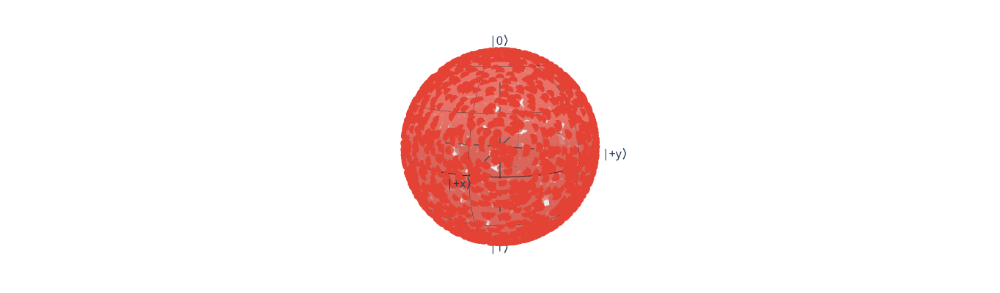

In [60]:
print("Distribución de estados aleatorios para la función de qiskit random_statevector() : ")
bloch_qiskit

Distribución de estados aleatorios para la función estado_aleatorio()


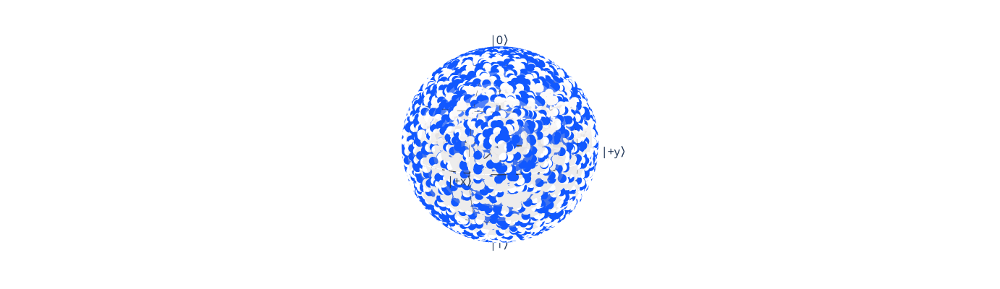

In [30]:
print("Distribución de estados aleatorios para la función estado_aleatorio()")
bloch_aleatorio

Distribución de estados aleatorios para la función estado_aleatorio_normal() : 


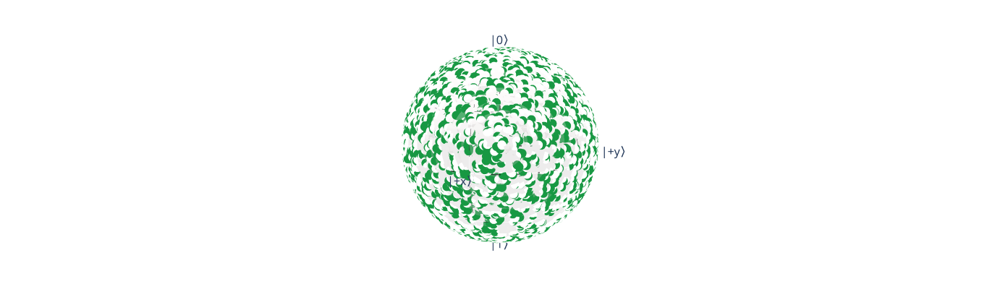

In [32]:
print("Distribución de estados aleatorios para la función estado_aleatorio_normal() : ")  
bloch_normal

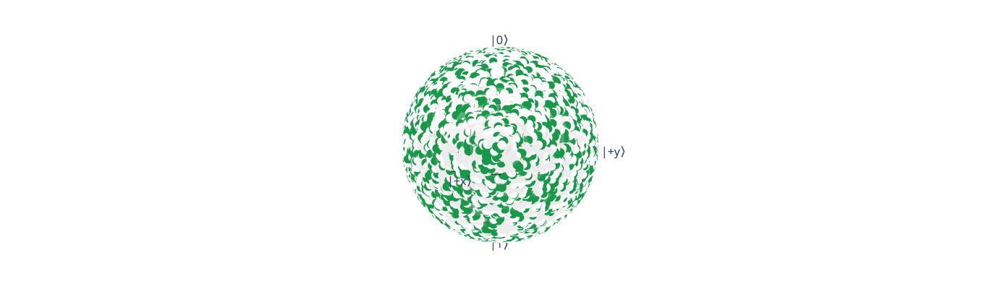

In [33]:
bloch_normal_2

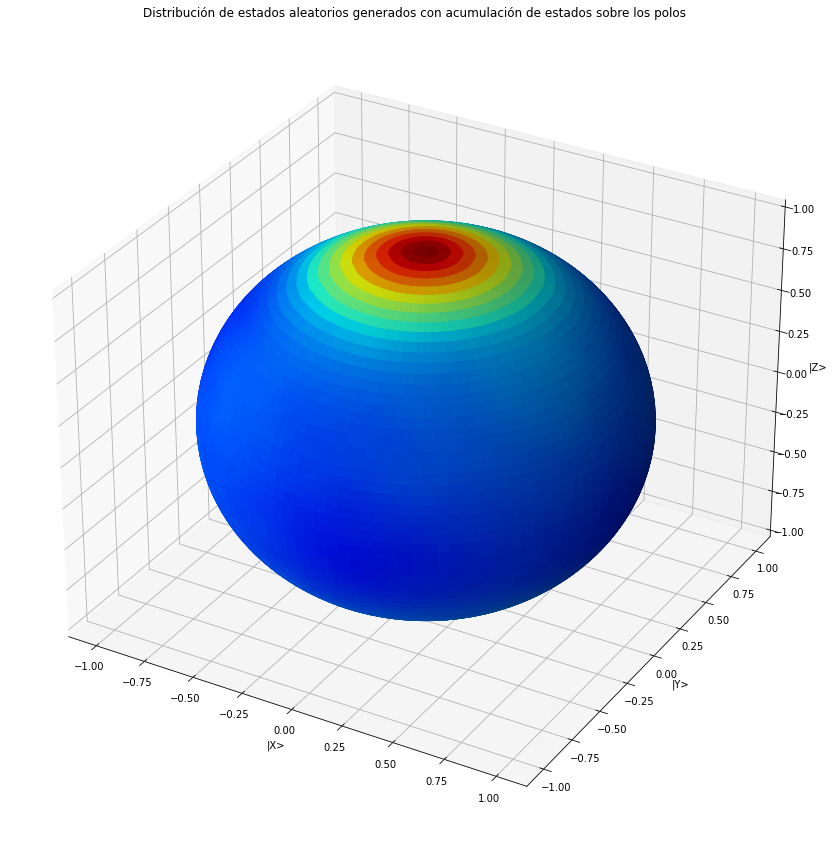

In [35]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

def near( p, pntList, d0 ):
    cnt=0
    for pj in pntList:
        dist=np.linalg.norm( p - pj )
        if dist < d0:
            cnt += 1 - dist/d0
    return cnt


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot( 1, 1, 1, projection='3d')
ax.title
ax.set_xlabel("|X>")
ax.set_ylabel("|Y>")
ax.set_zlabel("|Z>")
ax.set_title("Distribución de estados aleatorios generados con acumulación de estados sobre los polos")
u = np.linspace( 0, 2 * np.pi, 120)
v = np.linspace( 0, np.pi, 60 )

# create the sphere surface
XX =  np.outer( np.cos( u ), np.sin( v ) )
YY =  np.outer( np.sin( u ), np.sin( v ) )
ZZ =  np.outer( np.ones( np.size( u ) ), np.cos( v ) )

WW = XX.copy()
for i in range( len( XX ) ):
    for j in range( len( XX[0] ) ):
        x = XX[ i, j ]
        y = YY[ i, j ]
        z = ZZ[ i, j ]
        WW[ i, j ] = near(np.array( [x, y, z ] ), np.array(vec2), 0.5)
WW = WW / np.amax( WW )
myheatmap = WW

# ~ ax.scatter( *zip( *pointList ), color='#dd00dd' )
ax.plot_surface( XX, YY,  ZZ, cstride=1, rstride=1, facecolors=cm.jet( myheatmap ) )
plt.show() 

(array([[227., 220., 250., 359., 452., 469., 299., 269., 240., 215.],
        [205., 233., 292., 316., 493., 472., 330., 258., 206., 195.],
        [615., 249., 232., 185., 197., 227., 209., 241., 251., 594.]]),
 array([-9.99999415e-01, -7.99999528e-01, -5.99999641e-01, -3.99999755e-01,
        -1.99999868e-01,  1.87277889e-08,  1.99999905e-01,  3.99999792e-01,
         5.99999679e-01,  7.99999565e-01,  9.99999452e-01]),
 <a list of 3 BarContainer objects>)

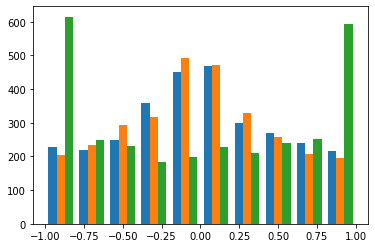

In [46]:
#Histograma perteneciente a la distribución con acumulación en los polos
hist0=plt.hist(np.array(vec2))

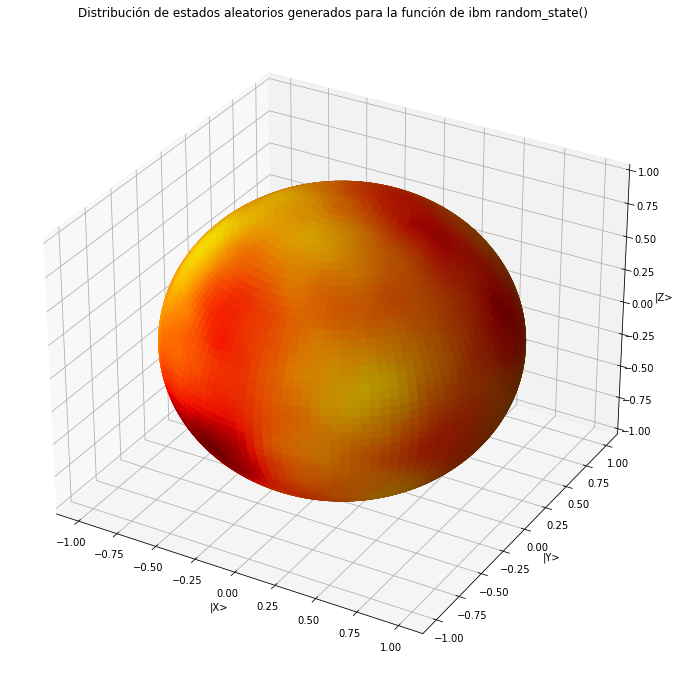

In [36]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot( 1, 1, 1, projection='3d')
ax.title
ax.set_xlabel("|X>")
ax.set_ylabel("|Y>")
ax.set_zlabel("|Z>")
ax.set_title("Distribución de estados aleatorios generados para la función de ibm random_state()")
u = np.linspace( 0, 2 * np.pi, 120)
v = np.linspace( 0, np.pi, 60 )

# create the sphere surface
XX =  np.outer( np.cos( u ), np.sin( v ) )
YY =  np.outer( np.sin( u ), np.sin( v ) )
ZZ =  np.outer( np.ones( np.size( u ) ), np.cos( v ) )

WW = XX.copy()
for i in range( len( XX ) ):
    for j in range( len( XX[0] ) ):
        x = XX[ i, j ]
        y = YY[ i, j ]
        z = ZZ[ i, j ]
        WW[ i, j ] = near(np.array( [x, y, z ] ), np.array(vec1), 0.5)
WW = WW / np.amax( WW )
myheatmap = WW

# ~ ax.scatter( *zip( *pointList ), color='#dd00dd' )
ax.plot_surface( XX, YY,  ZZ, cstride=1, rstride=1, facecolors=cm.jet( myheatmap ) )
plt.show() 

(array([[279., 304., 337., 308., 304., 298., 307., 276., 272., 314.],
        [316., 305., 296., 272., 307., 316., 301., 296., 291., 299.],
        [283., 319., 324., 292., 303., 273., 301., 315., 291., 298.]]),
 array([-9.99988546e-01, -7.99992520e-01, -5.99996494e-01, -4.00000467e-01,
        -2.00004441e-01, -8.41497919e-06,  1.99987611e-01,  3.99983638e-01,
         5.99979664e-01,  7.99975690e-01,  9.99971716e-01]),
 <a list of 3 BarContainer objects>)

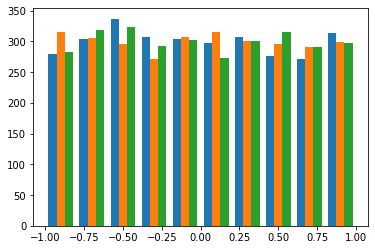

In [45]:
#Histograma para la función de IBM random_statevector()
hist1=plt.hist(np.array(vec1))

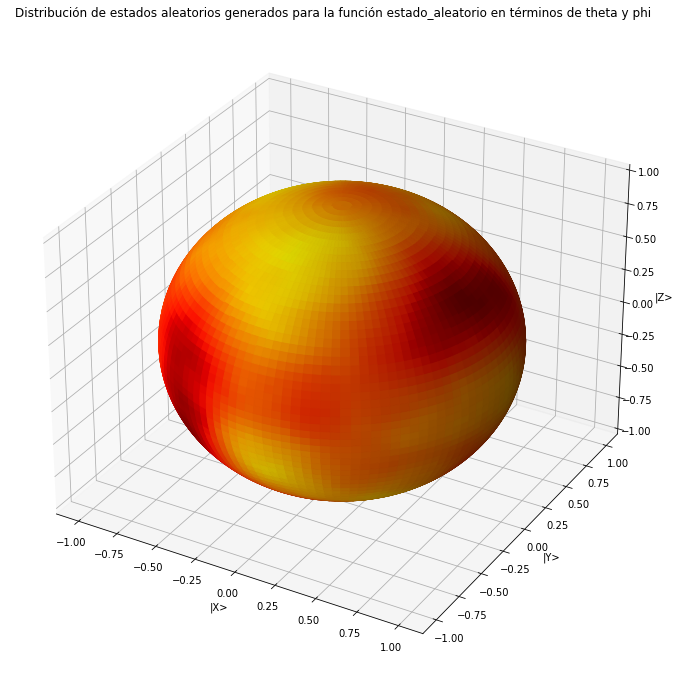

In [62]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot( 1, 1, 1, projection='3d')
ax.title
ax.set_xlabel("|X>")
ax.set_ylabel("|Y>")
ax.set_zlabel("|Z>")
ax.set_title("Distribución de estados aleatorios generados para la función estado_aleatorio en términos de theta y phi")
u = np.linspace( 0, 2 * np.pi, 120)
v = np.linspace( 0, np.pi, 60 )

# create the sphere surface
XX =  np.outer( np.cos( u ), np.sin( v ) )
YY =  np.outer( np.sin( u ), np.sin( v ) )
ZZ =  np.outer( np.ones( np.size( u ) ), np.cos( v ) )

WW = XX.copy()
for i in range( len( XX ) ):
    for j in range( len( XX[0] ) ):
        x = XX[ i, j ]
        y = YY[ i, j ]
        z = ZZ[ i, j ]
        WW[ i, j ] = near(np.array( [x, y, z ] ), np.array(vec2), 0.5)
WW = WW / np.amax( WW )
myheatmap = WW

# ~ ax.scatter( *zip( *pointList ), color='#dd00dd' )
ax.plot_surface( XX, YY,  ZZ, cstride=1, rstride=1, facecolors=cm.jet( myheatmap ) )
plt.show() 

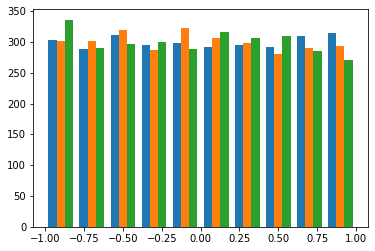

In [61]:
#Histograma para la función estado_aleatorio(): 
hist2=plt.hist(np.array(vec2))

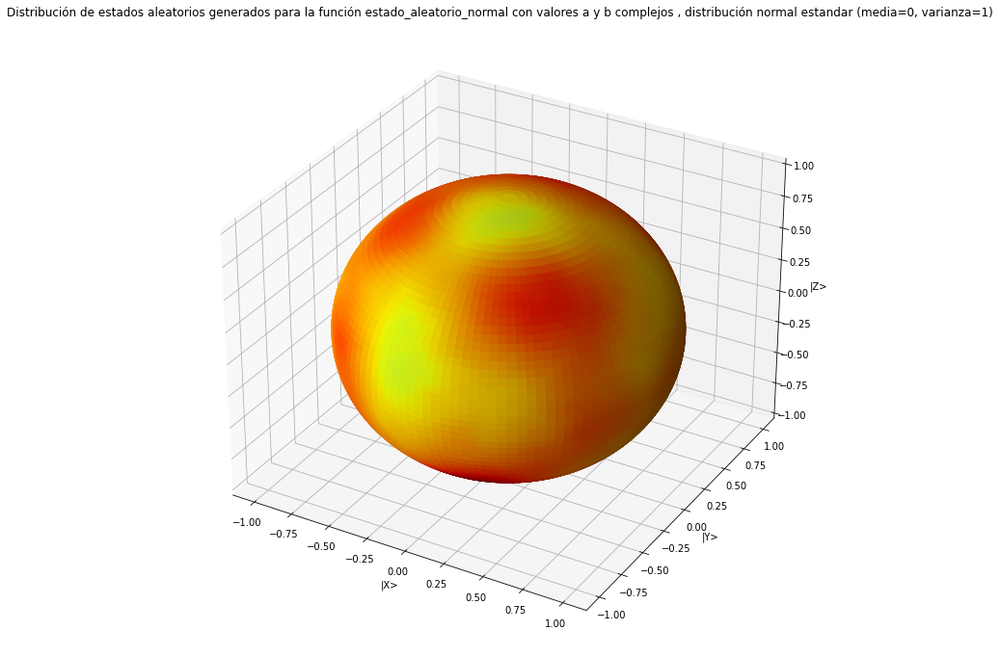

In [37]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot( 1, 1, 1, projection='3d')
ax.title
ax.set_xlabel("|X>")
ax.set_ylabel("|Y>")
ax.set_zlabel("|Z>")
ax.set_title("Distribución de estados aleatorios generados para la función estado_aleatorio_normal con valores a y b complejos , distribución normal estandar (media=0, varianza=1)")
u = np.linspace( 0, 2 * np.pi, 120)
v = np.linspace( 0, np.pi, 60 )

# create the sphere surface
XX =  np.outer( np.cos( u ), np.sin( v ) )
YY =  np.outer( np.sin( u ), np.sin( v ) )
ZZ =  np.outer( np.ones( np.size( u ) ), np.cos( v ) )

WW = XX.copy()
for i in range( len( XX ) ):
    for j in range( len( XX[0] ) ):
        x = XX[ i, j ]
        y = YY[ i, j ]
        z = ZZ[ i, j ]
        WW[ i, j ] = near(np.array( [x, y, z ] ), np.array(vec3), 0.5)
WW = WW / np.amax( WW )
myheatmap = WW

# ~ ax.scatter( *zip( *pointList ), color='#dd00dd' )
ax.plot_surface( XX, YY,  ZZ, cstride=1, rstride=1, facecolors=cm.jet( myheatmap ) )
plt.show() 

(array([[292., 311., 292., 287., 308., 296., 318., 295., 316., 285.],
        [274., 323., 329., 303., 298., 288., 281., 304., 292., 308.],
        [313., 313., 308., 293., 305., 278., 281., 291., 322., 296.]]),
 array([-9.99820357e-01, -7.99858855e-01, -5.99897353e-01, -3.99935851e-01,
        -1.99974348e-01, -1.28462892e-05,  1.99948656e-01,  3.99910158e-01,
         5.99871660e-01,  7.99833162e-01,  9.99794664e-01]),
 <a list of 3 BarContainer objects>)

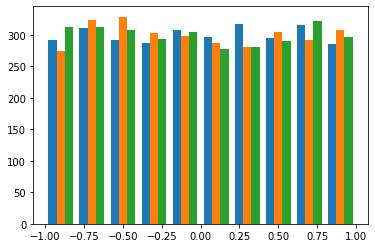

In [47]:
#Histograma para la distribución normal generando a y b complejos (mu=0, sigma=1)
hist3=plt.hist(np.array(vec3))

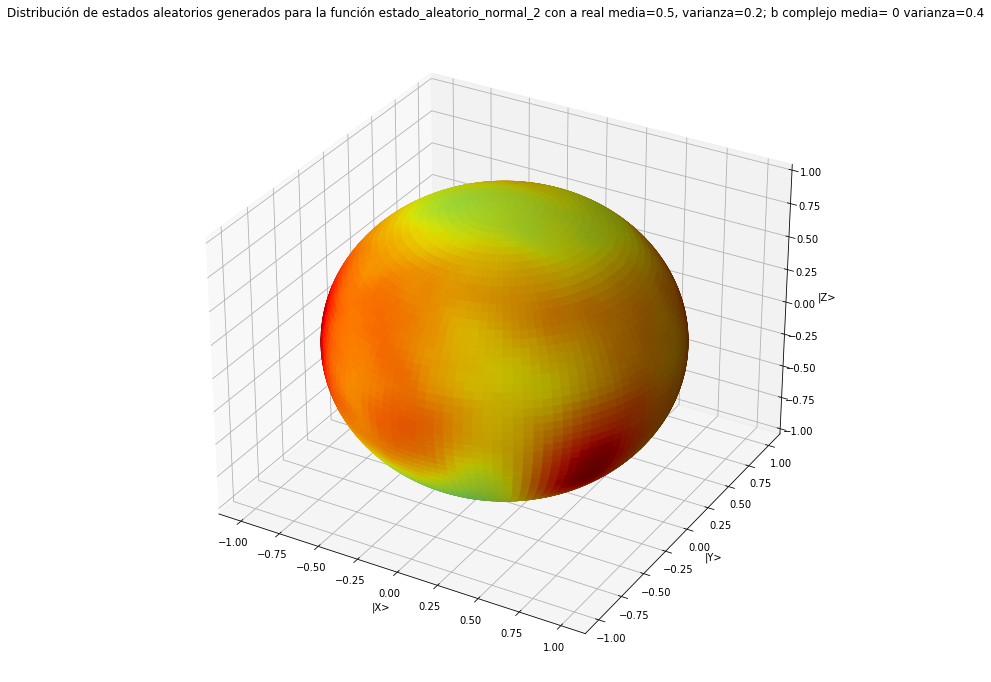

In [42]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot( 1, 1, 1, projection='3d')
ax.title
ax.set_xlabel("|X>")
ax.set_ylabel("|Y>")
ax.set_zlabel("|Z>")
ax.set_title("Distribución de estados aleatorios generados para la función estado_aleatorio_normal_2 con a real media=0.5, varianza=0.2; b complejo media= 0 varianza=0.4")
u = np.linspace( 0, 2 * np.pi, 120)
v = np.linspace( 0, np.pi, 60 )

# create the sphere surface
XX =  np.outer( np.cos( u ), np.sin( v ) )
YY =  np.outer( np.sin( u ), np.sin( v ) )
ZZ =  np.outer( np.ones( np.size( u ) ), np.cos( v ) )

WW = XX.copy()
for i in range( len( XX ) ):
    for j in range( len( XX[0] ) ):
        x = XX[ i, j ]
        y = YY[ i, j ]
        z = ZZ[ i, j ]
        WW[ i, j ] = near(np.array( [x, y, z ] ), np.array(vec4), 0.5)
WW = WW / np.amax( WW )
myheatmap = WW

# ~ ax.scatter( *zip( *pointList ), color='#dd00dd' )
ax.plot_surface( XX, YY,  ZZ, cstride=1, rstride=1, facecolors=cm.jet( myheatmap ) )
plt.show() 

(array([[343., 321., 284., 289., 286., 265., 259., 291., 338., 324.],
        [303., 295., 316., 337., 243., 255., 263., 297., 343., 348.],
        [188., 252., 306., 346., 343., 368., 307., 333., 283., 274.]]),
 array([-9.99892013e-01, -7.99905023e-01, -5.99918034e-01, -3.99931044e-01,
        -1.99944055e-01,  4.29344878e-05,  2.00029924e-01,  4.00016913e-01,
         6.00003903e-01,  7.99990892e-01,  9.99977882e-01]),
 <a list of 3 BarContainer objects>)

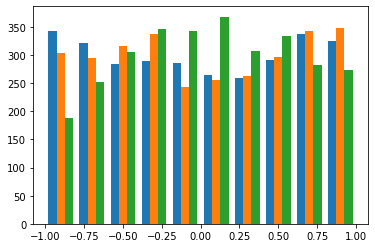

In [49]:
#Histograma para estado_normal_2() con a real (mu=0.5 , sigma=0.2), y b complejo ( mu=0, sigma=0.4)
hist4=plt.hist( np.array(vec4))

(array([[3350., 3182., 2926., 2661., 2920., 2813., 2852., 2859., 3079.,
         3358.],
        [3285., 3200., 2926., 2771., 2854., 2903., 2800., 2917., 3082.,
         3262.],
        [1986., 2651., 3200., 3353., 3427., 3396., 3276., 3067., 2928.,
         2716.]]),
 array([-9.99999907e-01, -8.00000513e-01, -6.00001120e-01, -4.00001726e-01,
        -2.00002333e-01, -2.93900973e-06,  1.99996455e-01,  3.99995848e-01,
         5.99995242e-01,  7.99994635e-01,  9.99994029e-01]),
 <a list of 3 BarContainer objects>)

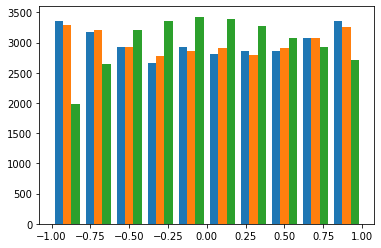

In [99]:
plt.hist(np.array(vec4))

###  Medición de la distancia promedio para cada una de las funciones  

In [88]:
distan0=distancias_prom(vec0)
distan1=distancias_prom(vec1)
distan2=distancias_prom(vec2)
distan3=distancias_prom(vec3)
distan4=distancias_prom(vec4)


print("Distribuciones para ",n,"estados generados")

print("Función aleatorio_erroneo_polos")
print("Separación media entra estados: ",np.mean(distan0))
print("Desviación estándar :",np.std(distan0),"\n")

print("Función de IBM random_statevector(2) para")
print("Separación media entra estados: ",np.mean(distan1))
print("Desviación estándar :",np.std(distan1),"\n")

print("Función estado_aleatorio en términos de theta y phi usando una distribución uniforme ")
print("Separación media entra estados: ",np.mean(distan2))
print("Desviación estándar :",np.std(distan2),"\n")

print("Función estado_normal con distribución gaussiana (media=0, varianza=1) generando a,b como complejos")
print("Separación media entra estados: ",np.mean(distan3))
print("Desviación estándar :",np.std(distan3),"\n")

print("Función estado_normal_2 con distribución gaussiana (media=0.5, varianza=.2) para a como real y media=0,varianza=0.4 para b")
print("Separación media entra estados: ",np.mean(distan4))
print("Desviación estándar :",np.std(distan4),"\n")

Distribuciones para  3000 estados generados
Función aleatorio_erroneo_polos
Separación media entra estados:  1.3218584548615187
Desviación estándar : 0.02800664849246773 

Función de IBM random_statevector(2) para
Separación media entra estados:  1.3335252117613783
Desviación estándar : 0.005218479162277083 

Función estado_aleatorio en términos de theta y phi usando una distribución uniforme 
Separación media entra estados:  1.3334721102036717
Desviación estándar : 0.006577913894065835 

Función estado_normal con distribución gaussiana (media=0, varianza=1) generando a,b como complejos
Separación media entra estados:  1.3334819465861696
Desviación estándar : 0.004745361106156811 

Función estado_normal_2 con distribución gaussiana (media=0.5, varianza=.2) para a como real y media=0,varianza=0.4 para b
Separación media entra estados:  1.3316252299624696
Desviación estándar : 0.014311285229730875 



In [118]:

# x_qiskt=[]
# y_qiskt=[]
# z_qiskt=[]
# x_estalea=[]
# y_estalea=[]
# z_estalea=[]
# x_normal=[]
# y_normal=[]
# z_normal=[]

# x_normal_2=[]
# y_normal_2=[]
# z_normal_2=[]

# for i in range(0,len(vec1)):
#     x_qiskt.append(vec1[i][0])
#     y_qiskt.append(vec1[i][1])
#     z_qiskt.append(vec1[i][2])
    
#     x_estalea.append(vec2[i][0])
#     y_estalea.append(vec2[i][1])
#     z_estalea.append(vec2[i][2])
    
#     x_normal.append(vec3[i][0])
#     y_normal.append(vec3[i][1])
#     z_normal.append(vec3[i][2])
    
#     x_normal_2.append(vec4[i][0])
#     y_normal_2.append(vec4[i][1])
#     z_normal_2.append(vec4[i][2])
    
# fig, axs = plt.subplots()
# fig.suptitle('Distribución de estados en la esfera de Bloch para random_state() de qiskit para n=10000', fontsize=13)
# axs.set_title("Plano sigmax,sigmaz")
# axs.set_xlabel("sigmax")
# axs.set_ylabel("sigmay")
# a=axs.hexbin(x_qiskt,z_qiskt,gridsize=(30),cmap=plt.cm.viridis)
# fig.colorbar(a,ax=axs)

# fig, axs = plt.subplots()
# axs.set_title("Plano sigmay,sigmaz")
# axs.set_xlabel("sigmay")
# axs.set_ylabel("sigmaz")
# a=axs.hexbin(y_qiskt,z_qiskt,gridsize=(30),cmap=plt.cm.viridis)
# fig.colorbar(a,ax=axs)

# fig, axs = plt.subplots()
# axs.set_title("Plano sigmax,sigmay")
# axs.set_xlabel("sigmax")
# axs.set_ylabel("sigmay")
# a=axs.hexbin(x_qiskt,y_qiskt,gridsize=(30),cmap=plt.cm.viridis)
# fig.colorbar(a,ax=axs)


# plt.show()

Traceback (most recent call last):
  File "<ipython-input-118-dc2847760494>", line 1, in <module>
    max(myheatmap)
ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

Use %tb to get the full traceback.
